In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.stats import pearsonr


In [5]:
BankData = pd.read_excel("BankData.xlsx")
BankData

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown,yes
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown,yes
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,yes
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,unknown,no


In [6]:
BankData.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no


In [7]:
BankData.describe() #returns description of the data

,age,balance,day,duration,campaign,pdays,previous
count,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000
mean,40.936210,1362.272058,15.806419,258.163080,2.763841,40.197828,0.580323
std,10.618762,3044.765829,8.322476,257.527812,3.098021,100.128746,2.303441
min,18.000000,-8019.000000,1.000000,0.000000,1.000000,-1.000000,0.000000
25%,33.000000,72.000000,8.000000,103.000000,1.000000,-1.000000,0.000000
50%,39.000000,448.000000,16.000000,180.000000,2.000000,-1.000000,0.000000
75%,48.000000,1428.000000,21.000000,319.000000,3.000000,-1.000000,0.000000
max,95.000000,102127.000000,31.000000,4918.000000,63.000000,871.000000,275.000000


In [8]:
pd.options.display.float_format = '{:,.2f}'.format

In [9]:
BankData.shape

(45211, 17)

In [10]:
BankData.columns

Index(['age', 'job', 'marital', 'education', 'default', 'balance', 'housing',
       'loan', 'contact', 'day', 'month', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'y'],
      dtype='object')

In [11]:
BankData.isnull().sum() # NO NULL VALUES PRESENT IN THE DATA

age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
y            0
dtype: int64

In [12]:
BankData.shape  #SHAPE OF THE DATA

(45211, 17)

In [13]:
BankData.corr()

<ipython-input-13-aa2b3083dea0>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  BankData.corr()


,age,balance,day,duration,campaign,pdays,previous
age,1.00,0.10,-0.01,-0.00,0.00,-0.02,0.00
balance,0.10,1.00,0.00,0.02,-0.01,0.00,0.02
day,-0.01,0.00,1.00,-0.03,0.16,-0.09,-0.05
duration,-0.00,0.02,-0.03,1.00,-0.08,-0.00,0.00
campaign,0.00,-0.01,0.16,-0.08,1.00,-0.09,-0.03
pdays,-0.02,0.00,-0.09,-0.00,-0.09,1.00,0.45
previous,0.00,0.02,-0.05,0.00,-0.03,0.45,1.00


Identify data imbalanced (large number of the records represent a majority class and very few records represent the minority class)

Positive responses: 11.70% (5289)
Negative responses: 88.30% (39922)


<Axes: xlabel='y', ylabel='count'>

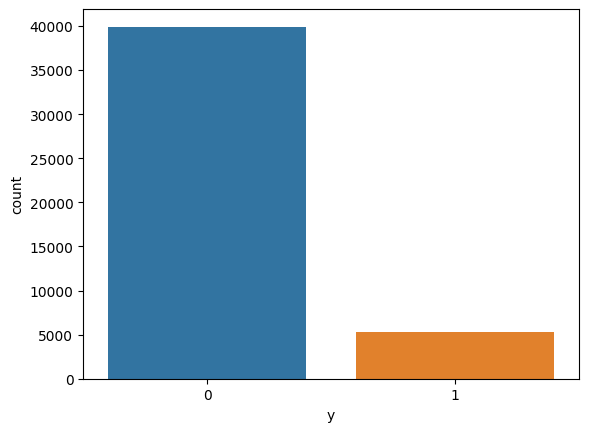

In [14]:
BankData['y'] = BankData['y'].apply(lambda x: 1 if x == 'yes' else 0)

pos_count = BankData['y'].sum()
neg_count = len(BankData) - pos_count

pos_percent = pos_count / len(BankData) * 100
neg_percent = neg_count / len(BankData) * 100

print('Positive responses: {:.2f}% ({})'.format(pos_percent, pos_count))
print('Negative responses: {:.2f}% ({})'.format(neg_percent, neg_count))
sns.countplot(x='y', data=BankData)

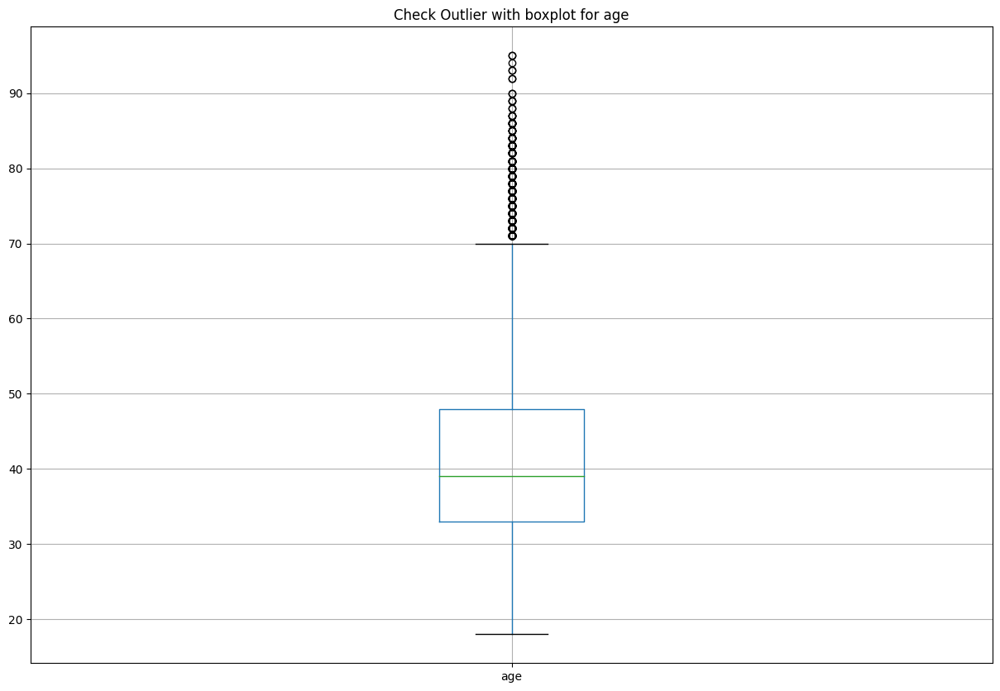

In [15]:
#CHECKING FOR THE ANY OUTLIER PRESENT IN THE AGE 

plt.figure(figsize=(15,10))
plt.title("Check Outlier with boxplot for age")
BankData.boxplot(column=['age']);

<Figure size 2000x1000 with 0 Axes>

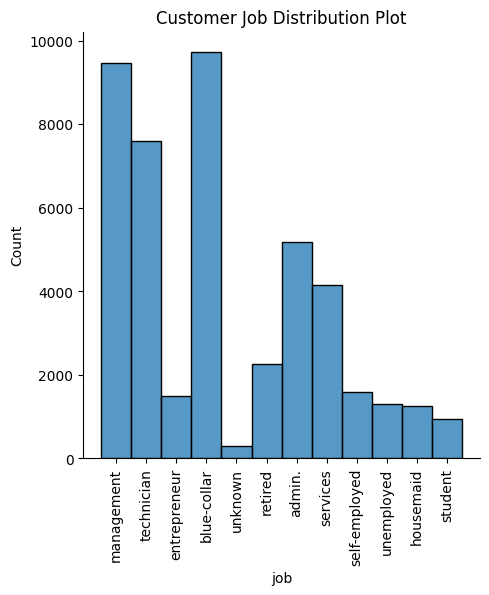

In [16]:
plt.figure(figsize=[20,10])
chart=sns.displot(BankData['job'])
plt.title('Customer Job Distribution Plot')
chart.set_xticklabels(rotation=90)

Text(0.5, 1.0, 'Loan Pie Chart')

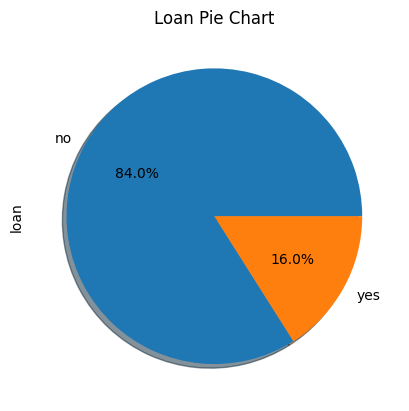

In [17]:
#Display the percent value of Loan Taken Yes or No only by the Customer

BankData['loan'].value_counts().plot.pie(autopct='%1.1f%%',shadow=True) 
plt.title("Loan Pie Chart")

<Axes: ylabel='age'>

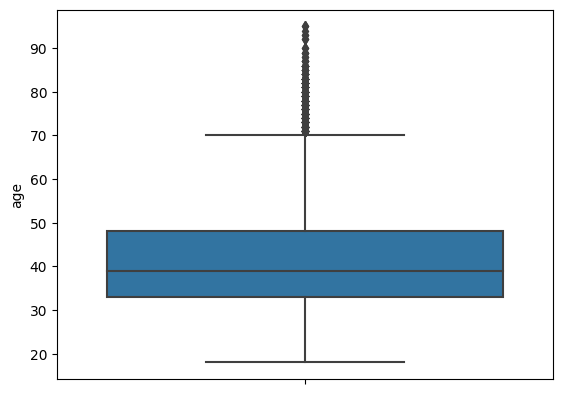

In [18]:
import seaborn as sns
sns.boxplot(y='age',data=BankData)

<Axes: title={'center': 'Education of the Customer'}, xlabel='education', ylabel='count'>

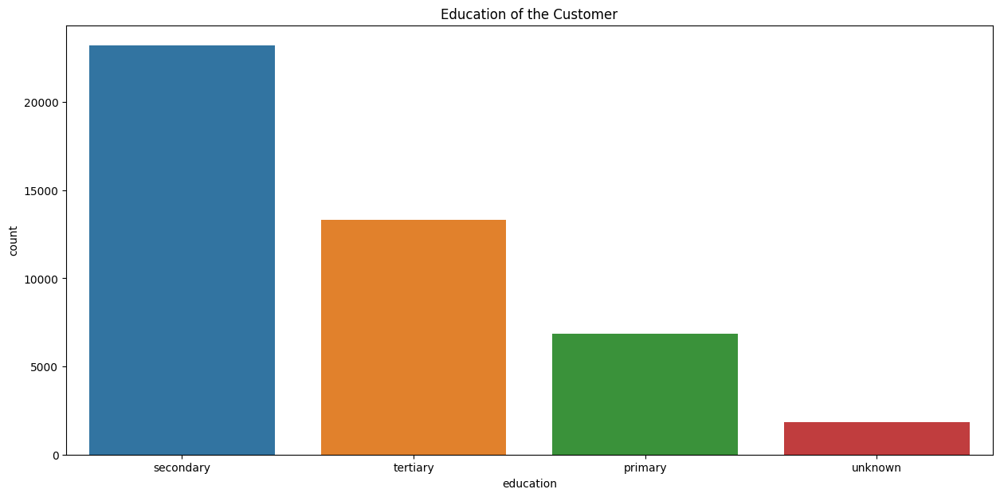

In [19]:
plt.figure(figsize=(15,7))
plt.title("Education of the Customer")
order = BankData['education'].value_counts(ascending=False).index 
sns.countplot(x='education', data=BankData, order=order)

<Axes: title={'center': 'JobType of Subscribed Customers'}, xlabel='job', ylabel='count'>

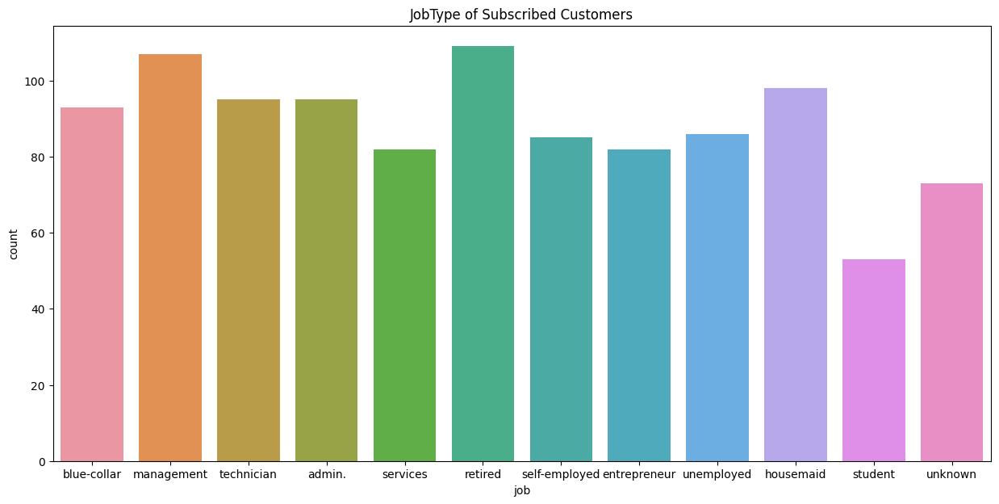

In [20]:
response_df = BankData[['age', 'job', 'y']]
grouped_df = response_df.groupby(['age', 'job', 'y']).size().reset_index(name='count')
yes_responses_df = grouped_df[grouped_df['y'] == 'yes']
sorted_df = yes_responses_df.sort_values(['job', 'count'], ascending=[True, False])


plt.figure(figsize=(15,7))
plt.title("JobType of Subscribed Customers")
order = BankData['job'].value_counts(ascending=False).index 
sns.countplot(x='job', data=grouped_df, order=order)

<ipython-input-21-d4a0540296eb>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(BankData.corr(), annot=True, cmap="YlGnBu")


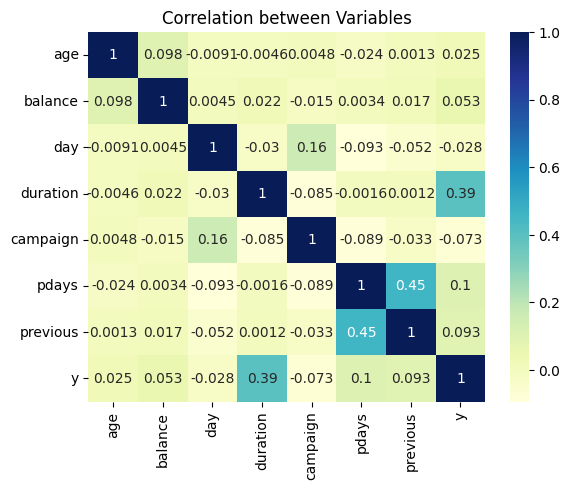

In [21]:
sns.heatmap(BankData.corr(), annot=True, cmap="YlGnBu")
plt.title("Correlation between Variables")
plt.show()

<ipython-input-22-657df13a6f72>:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = BankData.corr().round(2)
<ipython-input-22-657df13a6f72>:6: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = np.zeros_like(corr, dtype=np.bool)


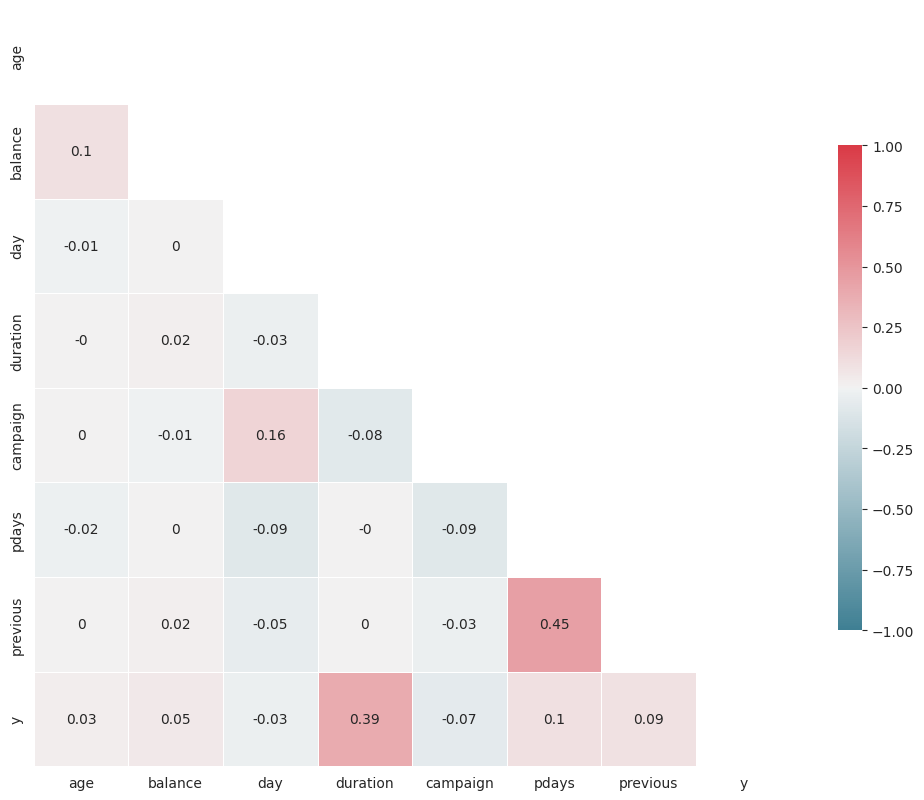

In [22]:
sns.set_style("white")
# Generate and visualize the correlation matrix
corr = BankData.corr().round(2)

# Mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set figure size
f, ax = plt.subplots(figsize=(10, 10))

# Define custom colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap
sns.heatmap(corr, mask=mask, cmap=cmap, vmin=-1, vmax=1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)

plt.tight_layout()

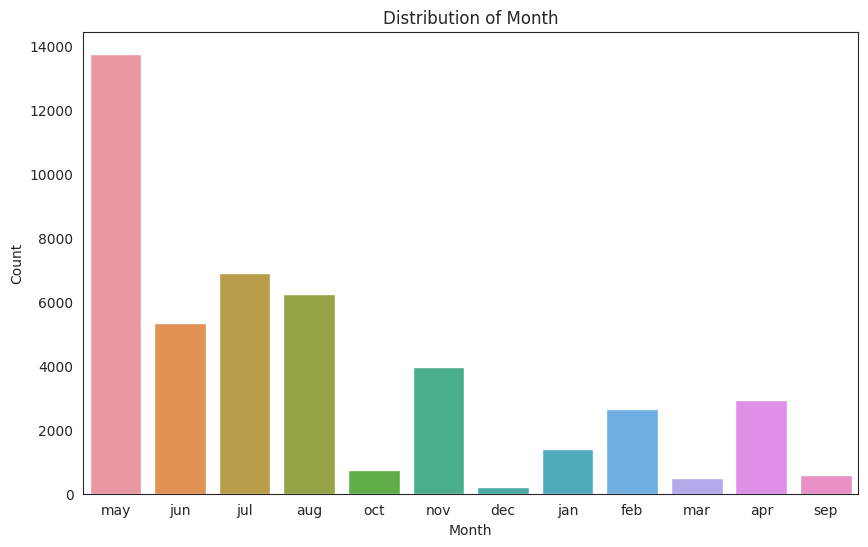

In [23]:
# Bar chart of month
plt.figure(figsize=(10, 6))
sns.countplot(x='month', data=BankData)
plt.xlabel('Month')
plt.ylabel('Count')
plt.title('Distribution of Month')
plt.show()

In [24]:
print(BankData.shape)

(45211, 17)


## **DATA** **CLEANING**

---



In [25]:
print(BankData.head())

   age           job  marital  education default  balance housing loan  \
0   58    management  married   tertiary      no     2143     yes   no   
1   44    technician   single  secondary      no       29     yes   no   
2   33  entrepreneur  married  secondary      no        2     yes  yes   
3   47   blue-collar  married    unknown      no     1506     yes   no   
4   33       unknown   single    unknown      no        1      no   no   

   contact  day month  duration  campaign  pdays  previous poutcome  y  
0  unknown    5   may       261         1     -1         0  unknown  0  
1  unknown    5   may       151         1     -1         0  unknown  0  
2  unknown    5   may        76         1     -1         0  unknown  0  
3  unknown    5   may        92         1     -1         0  unknown  0  
4  unknown    5   may       198         1     -1         0  unknown  0  


In [26]:
# Drop unnecessary columns "default, loan, contact, day"
BankData = BankData.drop(['default', 'loan', 'contact', 'day'], axis=1)

In [27]:
# Rename the target variable column
BankData = BankData.rename(columns={'y': 'target'})

# Check for missing values in the target column
BankData['target'].isnull().sum()  # There are no missing values

# Replace NaN values with 0 and the rest with 1
BankData['target'] = BankData['target'].fillna(0)
BankData['target'] = BankData['target'].replace('yes', 1)


<Axes: >

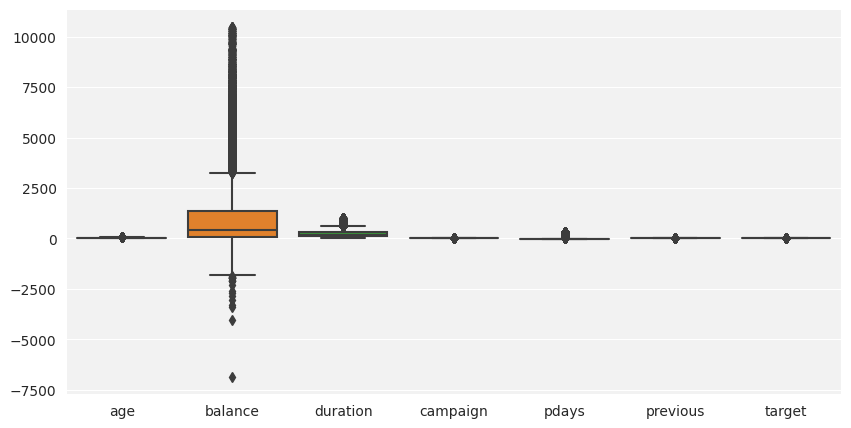

In [28]:
from seaborn.categorical import boxplot
# Set the background color
sns.set_style("darkgrid", {"axes.facecolor": "#f2f2f2"})
# Handle outliers
z_scores = stats.zscore(BankData[['age', 'balance', 'duration', 'campaign', 'pdays', 'previous']])
abs_z_scores = np.abs(z_scores)
filtered_entries = (abs_z_scores < 3).all(axis=1)
B1 = BankData[filtered_entries]
plt.figure(figsize=(10, 5))
boxplot(B1)

In [29]:
# Remove rows with negative balance
BankData = BankData[BankData['balance'] > 0]

<Axes: >

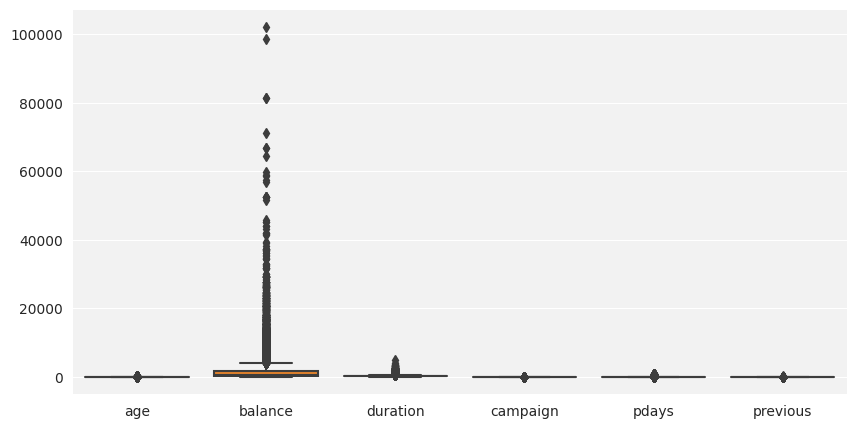

In [30]:
# Set the background color
sns.set_style("darkgrid", {"axes.facecolor": "#f2f2f2"})
plt.figure(figsize=(10, 5))
boxplot(BankData[['age', 'balance', 'duration', 'campaign', 'pdays', 'previous']])

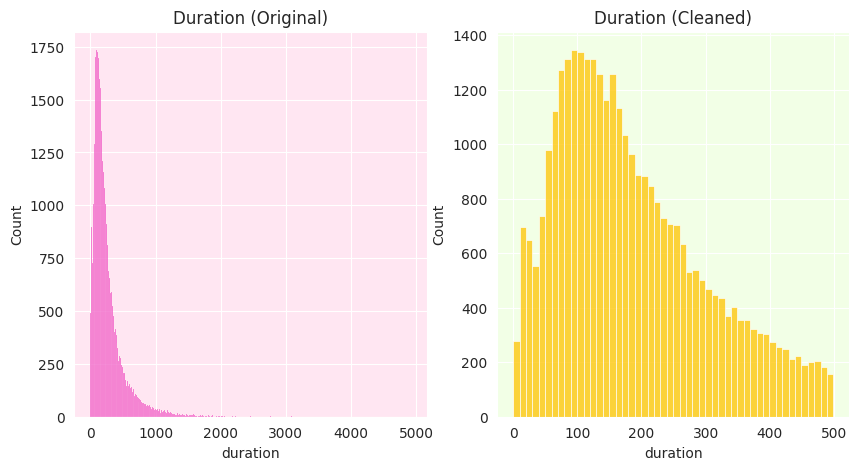

In [31]:
import seaborn as sns
import matplotlib.pyplot as plt

# Define the color palette
palette = sns.color_palette("bright")

# Create the figure and the subplots
fig, axs = plt.subplots(ncols=2, figsize=(10, 5))

# Plot the original data in the left subplot
sns.histplot(BankData['duration'], color=palette[6], ax=axs[0])
axs[0].set_title("Duration (Original)")
axs[0].set_facecolor('#ffe6f2')

# Remove rows with negative balance
BankData = BankData[BankData['duration'] < 500]

# Plot the cleaned data in the right subplot
sns.histplot(BankData['duration'],color=palette[8], ax=axs[1])
axs[1].set_title("Duration (Cleaned)")
axs[1].set_facecolor('#f2ffe6')

plt.show()

Text(0.5, 1.0, 'Age Distribution (Cleaned)')

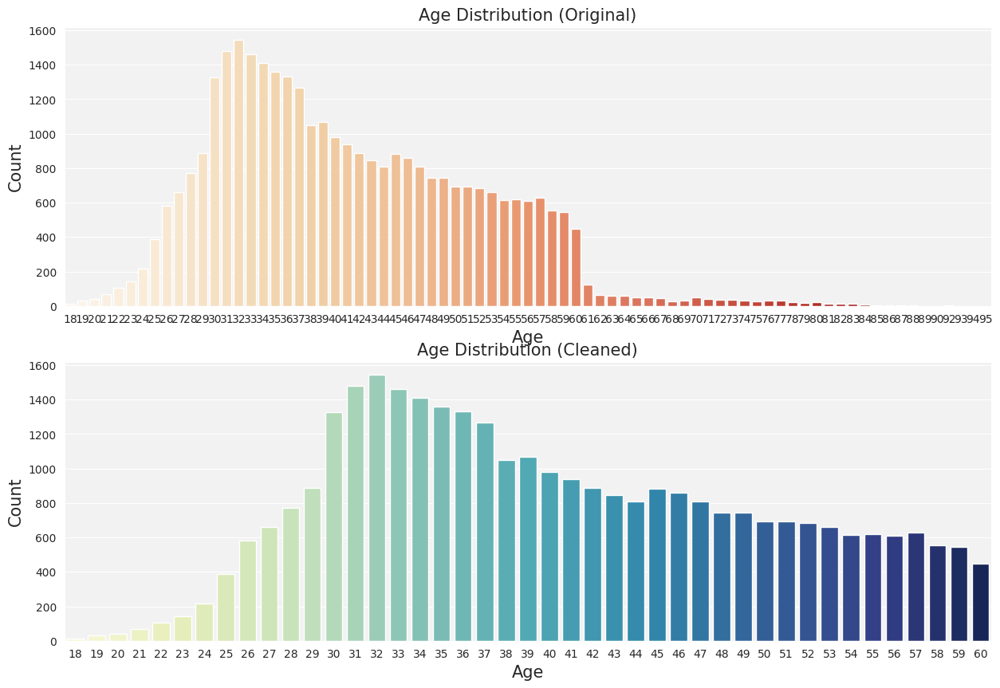

In [32]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the background color
sns.set_style("darkgrid", {"axes.facecolor": "#f2f2f2"})

# Create the figure and the subplots
fig, axs = plt.subplots(nrows=2, figsize=(15, 10))

# Plot the original data in the top subplot
sns.countplot(x='age', palette="OrRd", data=BankData, ax=axs[0])
axs[0].set_xlabel("Age", fontsize=15)
axs[0].set_ylabel("Count", fontsize=15)
axs[0].set_title("Age Distribution (Original)", fontsize=15)

# Remove outliers for age column above 60
BankData = BankData[BankData['age'] <= 60]

# Plot the cleaned data in the bottom subplot
sns.countplot(x='age', palette="YlGnBu", data=BankData, ax=axs[1])
axs[1].set_xlabel("Age", fontsize=15)
axs[1].set_ylabel("Count", fontsize=15)
axs[1].set_title("Age Distribution (Cleaned)", fontsize=15)

<ipython-input-33-8eb379ee3ee0>:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = BankData.corr()


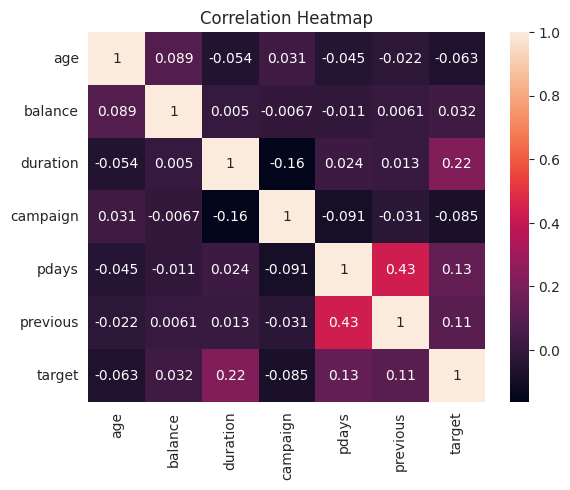

<Figure size 1000x1000 with 0 Axes>

In [33]:
import seaborn as sns
sns.set_style("darkgrid", {"axes.facecolor": "#E5E8E8"})
corr_matrix = BankData.corr()
sns.heatmap(corr_matrix, annot=True)
plt.title('Correlation Heatmap')
plt.figure(figsize=(10, 10))
plt.show()

In [34]:
print(BankData.head())

   age           job  marital  education  balance housing month  duration  \
0   58    management  married   tertiary     2143     yes   may       261   
1   44    technician   single  secondary       29     yes   may       151   
2   33  entrepreneur  married  secondary        2     yes   may        76   
3   47   blue-collar  married    unknown     1506     yes   may        92   
4   33       unknown   single    unknown        1      no   may       198   

   campaign  pdays  previous poutcome  target  
0         1     -1         0  unknown       0  
1         1     -1         0  unknown       0  
2         1     -1         0  unknown       0  
3         1     -1         0  unknown       0  
4         1     -1         0  unknown       0  


# **VISUALIZATION**

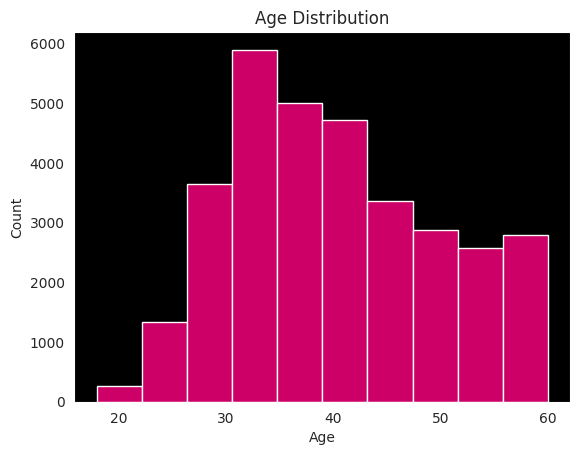

In [81]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style("dark", {"axes.facecolor": "#000000"})
plt.hist(BankData['age'], bins=10, color='#cc0066')
plt.title('Age Distribution')
plt.xlabel('Age')
plt.ylabel('Count')
plt.show()

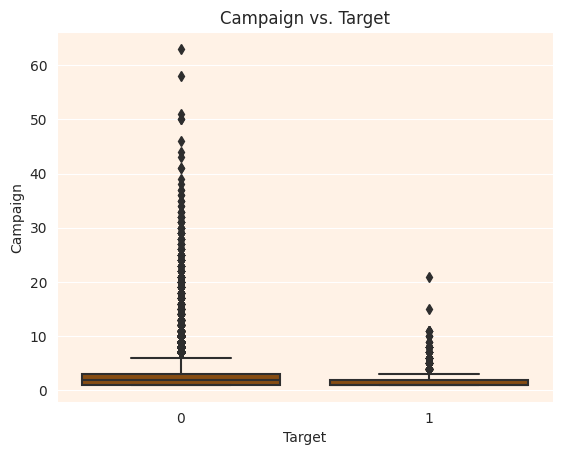

In [36]:
#Shows who has subscribed the campaign and not subcribed
import seaborn as sns
sns.set_style("darkgrid", {"axes.facecolor": "#fff2e6"})
sns.boxplot(x=BankData['target'], y=BankData['campaign'],color='#994d00')
plt.title('Campaign vs. Target')
plt.xlabel('Target')
plt.ylabel('Campaign')
plt.show()

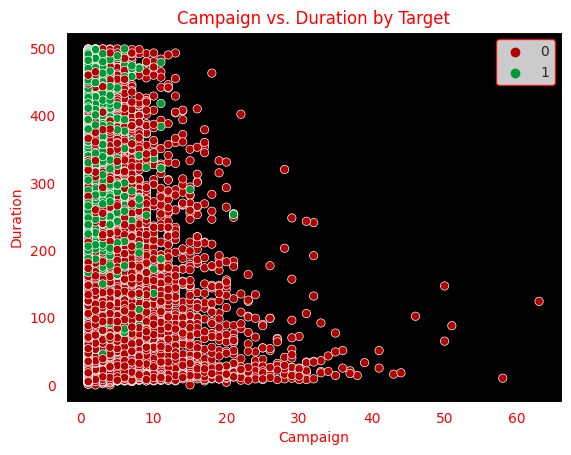

In [70]:
sns.set_style("dark", {"axes.facecolor": "black"})
palette_colors = ["#b30000", "#009933"]
sns.scatterplot(x="campaign", y="duration", hue="target", data=BankData, palette=palette_colors)
plt.title("Campaign vs. Duration by Target", color="red")
plt.xlabel("Campaign", color="red")
plt.ylabel("Duration", color="red")
plt.legend(facecolor='white',edgecolor='red')
plt.xticks(color="red")
plt.yticks(color="red")
plt.show()

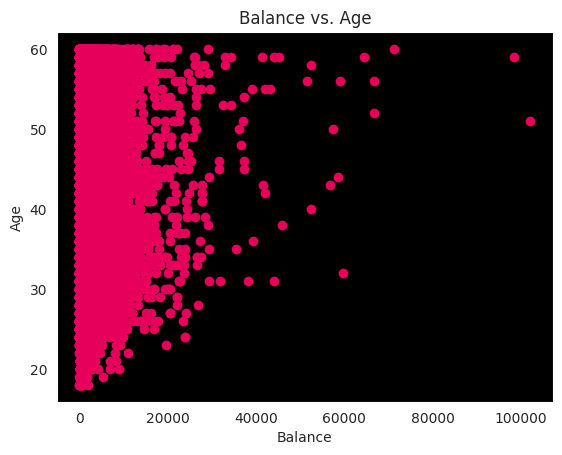

In [72]:
#Shows What age people have more balance
import matplotlib.pyplot as plt
sns.set_style("dark", {"axes.facecolor": "black"})
plt.scatter(BankData['balance'], BankData['age'],color='#e6005c')
plt.title('Balance vs. Age')
plt.xlabel('Balance')
plt.ylabel('Age')
plt.show()

In [39]:
import plotly.express as px

fig = px.scatter(BankData, x='age', y='duration', color='target', animation_frame='month',
                 color_continuous_scale='magma')
fig.update_layout(plot_bgcolor='#e6f7ff')
fig.show()

In [40]:
import plotly.express as px
import pandas as pd
fig = px.bar(BankData, x="marital", y="balance", animation_frame="age", color="target")
fig.update_layout(plot_bgcolor='#e6f7ff')
fig.show()

In [41]:
import plotly.express as px

fig = px.sunburst(BankData, path=['marital', 'education', 'job'], values='balance', color="target")
fig.update_layout(
    sliders=[
        dict(
            active=0,
            steps=[dict(label=str(age), method="update", args=[{"visible": [i == age for i in BankData['age']]}]) for age in BankData['age'].unique()],
            transition={'duration': 500},
            x=0.1, y=0, len=0.9, pad={"t": 50, "b": 10},
        )
    ]
)
fig.update_layout(plot_bgcolor='#e6f7ff')
fig.show()

In [42]:
import plotly.express as px

fig = px.scatter(BankData, x="duration", y="balance", color="target", animation_frame="age", 
                 range_x=[0, BankData["duration"].max()+10], range_y=[0, BankData["balance"].max()+1000])
fig.update_layout(plot_bgcolor='#e6f7ff')
fig.show()


In [43]:
import plotly.express as px
import pandas as pd
fig = px.scatter(BankData, x="duration", y="campaign", animation_frame="age", size="balance", color="target")
fig.update_layout(plot_bgcolor='#e6f7ff')
fig.show()

In [44]:
fig = px.scatter(BankData, x="balance", y="pdays", color="target", animation_frame="marital", size="campaign", hover_data=['job'])
fig.update_layout(plot_bgcolor='#e6f7ff')
fig.show()

In [45]:
print(BankData.head())

   age           job  marital  education  balance housing month  duration  \
0   58    management  married   tertiary     2143     yes   may       261   
1   44    technician   single  secondary       29     yes   may       151   
2   33  entrepreneur  married  secondary        2     yes   may        76   
3   47   blue-collar  married    unknown     1506     yes   may        92   
4   33       unknown   single    unknown        1      no   may       198   

   campaign  pdays  previous poutcome  target  
0         1     -1         0  unknown       0  
1         1     -1         0  unknown       0  
2         1     -1         0  unknown       0  
3         1     -1         0  unknown       0  
4         1     -1         0  unknown       0  


In [46]:
BankData

,age,job,marital,education,balance,housing,month,duration,campaign,pdays,previous,poutcome,target
0,58,management,married,tertiary,2143,yes,may,261,1,-1,0,unknown,0
1,44,technician,single,secondary,29,yes,may,151,1,-1,0,unknown,0
2,33,entrepreneur,married,secondary,2,yes,may,76,1,-1,0,unknown,0
3,47,blue-collar,married,unknown,1506,yes,may,92,1,-1,0,unknown,0
4,33,unknown,single,unknown,1,no,may,198,1,-1,0,unknown,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
45201,53,management,married,tertiary,583,no,nov,226,1,184,4,success,1
45202,34,admin.,single,secondary,557,no,nov,224,1,-1,0,unknown,1
45203,23,student,single,tertiary,113,no,nov,266,1,-1,0,unknown,1
45205,25,technician,single,secondary,505,no,nov,386,2,-1,0,unknown,1


# Analysis Questions

1.   How do customer demographics (such as age, income, or education level) impact their financial behavior?

Answer:  The F-statistic is 133.3125 and the p-value is 2.2364e-58.This means that customer education level does have an impact on their financial behavior, at least in terms of their bank account balance.

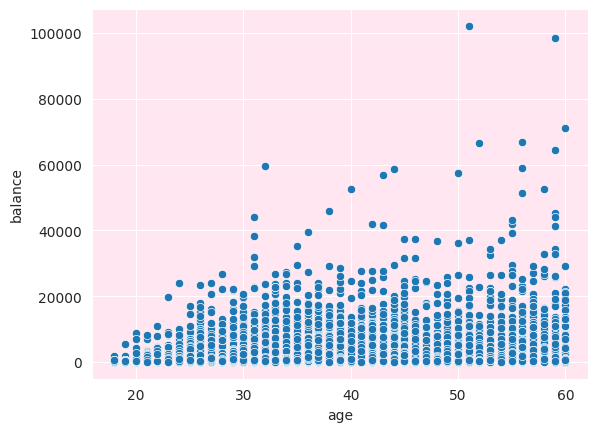

In [47]:
sns.scatterplot(data=BankData, x='age', y='balance')
plt.show()

In [48]:
from scipy.stats import f_oneway

tertiary = BankData[BankData['education'] == 'tertiary']['balance']
secondary = BankData[BankData['education'] == 'secondary']['balance']
primary = BankData[BankData['education'] == 'primary']['balance']

f_oneway(tertiary, secondary, primary)


F_onewayResult(statistic=133.3125436532041, pvalue=2.236417433129501e-58)

2. What is the overall response rate for the marketing campaign?

Answer: The output 0.07530426744723463 is the value of the response rate calculated by dividing this means that out of all the customers in the dataset, only 7.53% of them subscribed to the bank's term deposit.

In [49]:
total_customers = BankData.shape[0]
subscribed_customers = BankData[BankData['target'] == 1].shape[0]

response_rate = subscribed_customers / total_customers
response_rate

0.07530426744723463

3. Are customers with certain job types more likely to subscribe to the bank's term deposit?

Answer: Highest number of subscriptions by Management followed by technician, admin, blue-collar, student services and many more.

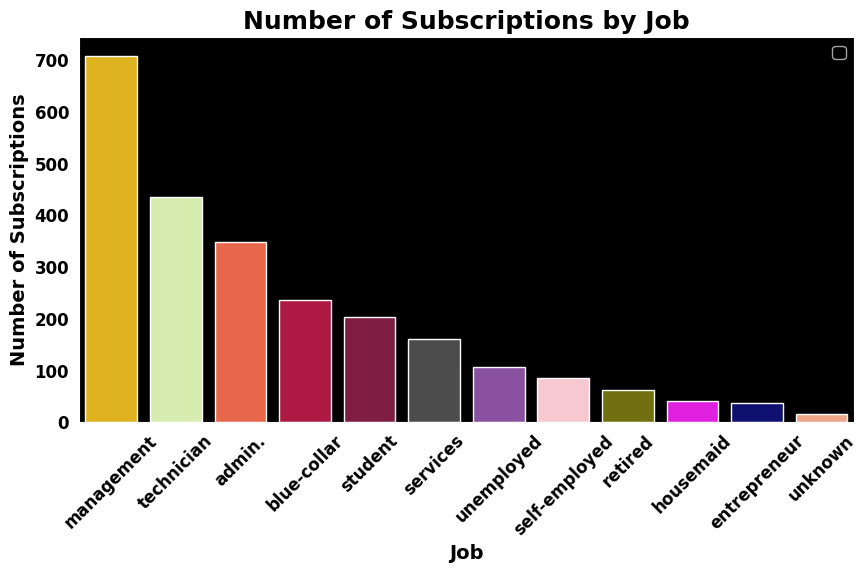

In [79]:
import seaborn as sns
import matplotlib.pyplot as plt

subscribed_data2 = BankData[BankData['target'] == 1]
job_counts = subscribed_data2['job'].value_counts()

sns.set_style("dark", {"axes.facecolor": "black"})
color_palette = ['#FFC300', '#DAF7A6', '#FF5733', '#C70039', '#900C3F', '#4C4C4C', '#8E44AD', '#FFC0CB', '#808000', '#FF00FF', '#000080', '#FFA07A']

plt.figure(figsize=(10,5))
sns.barplot(x=job_counts.index, y=job_counts.values, palette=color_palette)
plt.xticks(rotation=45, fontsize=12, fontweight='bold', color='black')
plt.yticks(fontsize=12, fontweight='bold', color='black')
plt.title("Number of Subscriptions by Job", fontsize=18, fontweight='bold', color='black')
plt.xlabel("Job", fontsize=14, fontweight='bold', color='black')
plt.ylabel("Number of Subscriptions", fontsize=14, fontweight='bold', color='black')

plt.legend(fontsize=12, facecolor='black')
plt.show()

In [51]:
print(BankData.head())

   age           job  marital  education  balance housing month  duration  \
0   58    management  married   tertiary     2143     yes   may       261   
1   44    technician   single  secondary       29     yes   may       151   
2   33  entrepreneur  married  secondary        2     yes   may        76   
3   47   blue-collar  married    unknown     1506     yes   may        92   
4   33       unknown   single    unknown        1      no   may       198   

   campaign  pdays  previous poutcome  target  
0         1     -1         0  unknown       0  
1         1     -1         0  unknown       0  
2         1     -1         0  unknown       0  
3         1     -1         0  unknown       0  
4         1     -1         0  unknown       0  


# Created a logistic regression model to predict which type of job people are more likely to subscribe to the campaign in the future.

In [52]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder


# convert categorical variables into numerical ones
ohe = OneHotEncoder()
X = ohe.fit_transform(BankData.drop(columns=['target']))
y = BankData['target']

# split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [53]:
from sklearn.linear_model import LogisticRegression

# create and fit the model
lr = LogisticRegression(max_iter=1000,random_state=42)
lr.fit(X_train, y_train)

LogisticRegression(max_iter=1000, random_state=42)

Use the model to make predictions on the testing data and evaluate its performance

In [54]:
from sklearn.metrics import accuracy_score

# make predictions on the testing data
y_pred = lr.predict(X_test)

# evaluate the model performance
print("Accuracy:", accuracy_score(y_test, y_pred))

Accuracy: 0.9340659340659341


## Future Predection

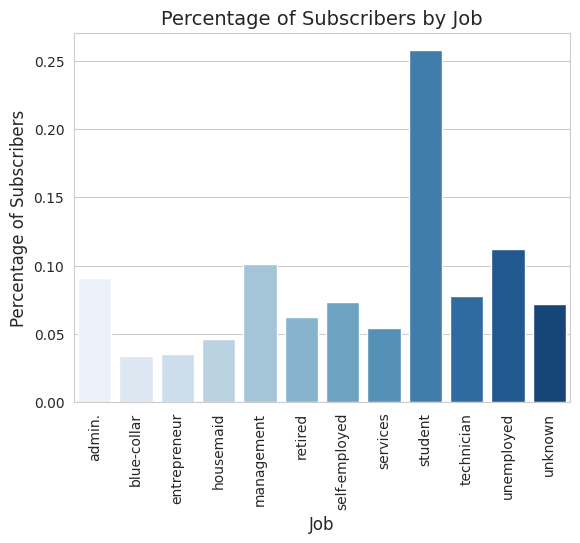

In [55]:
import seaborn as sns

# create a new dataframe with the original features and the target variable
data = BankData[['job', 'marital', 'target']].copy()

# calculate the percentage of subscribers for each job category
job_subscribers = data.groupby('job')['target'].mean().reset_index()

# create a bar chart showing the percentage of subscribers for each job category
sns.barplot(x='job', y='target', data=job_subscribers, palette='Blues')
plt.xticks(rotation=90, fontsize=10)
plt.yticks(fontsize=10)
plt.xlabel('Job', fontsize=12)
plt.ylabel('Percentage of Subscribers', fontsize=12)
plt.title('Percentage of Subscribers by Job', fontsize=14)
plt.show()

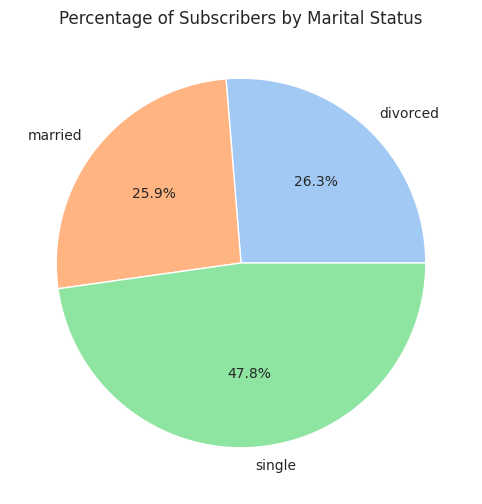

In [56]:
# calculate the percentage of subscribers for each marital status category
marital_subscribers = data.groupby('marital')['target'].mean().reset_index()

# create a pie chart showing the percentage of subscribers for each marital status category, add pallette and some more functionality for better visualization
sns.set_palette('pastel')
sns.set_style('whitegrid')
plt.figure(figsize=(8,6))
plt.pie(marital_subscribers['target'], labels=marital_subscribers['marital'], autopct='%1.1f%%')
plt.title('Percentage of Subscribers by Marital Status')
plt.show()